In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import shutil
import random

In [ ]:
# !git clone -b machine_learning https://github.com/fachrinnk4869/sugarWise.git

Cloning into 'sugarWise'...
remote: Enumerating objects: 21481, done.
remote: Counting objects: 100% (2779/2779), done.
remote: Compressing objects: 100% (2695/2695), done.
remote: Total 21481 (delta 83), reused 2752 (delta 80), pack-reused 18702
Receiving objects: 100% (21481/21481), 1.52 GiB | 34.28 MiB/s, done.
Resolving deltas: 100% (107/107), done.
Updating files: 100% (19364/19364), done.


In [ ]:
file_list = os.listdir('data_training')


# Find the minimum length of file names
min_length = min(len(os.listdir('data_training/' + file_name)) for file_name in file_list)
min_length

541

In [ ]:
train_dir = 'data-training'
valid_dir = 'data_validation'
test_dir = 'data_test'
extensions = []
for fldr in os.listdir(train_dir):
    sub_folder_path = os.path.join(train_dir, fldr)
    listdir = os.listdir(sub_folder_path)
    for i in range(len(listdir) - min_length):
        # Choose a random file from the list
        random_file = random.choice(os.listdir(sub_folder_path))

        # Construct the full path of the file
        file_path = os.path.join(sub_folder_path, random_file)

        # Remove the chosen file
        # os.remove(file_path)

In [ ]:
# delete folder sugarWise
# !rm -rf `find -type d -name sugarWise`
# !rm -rf  '/content/sugarWise/Test Data/apple/.ipynb_checkpoints'

In [ ]:
def copy_half(source_folder, destination_folder):
    # for folder in os.listdir(source_folder):
    #     source_path = os.path.join(source_folder, folder)
    #     destination_path = os.path.join(destination_folder, folder)
    #     if os.path.isdir(source_path):
    #         files = os.listdir(source_path)
    #         random.shuffle(files)
    #         copy_count = len(files) //2
    #         current_count = 0

    #         for file_name in files:
    #             source_file = os.path.join(source_path, file_name)
    #             destination_file = os.path.join(destination_path, file_name)

    #             if current_count < copy_count:
    #                 shutil.move(source_file, destination_file)
    #                 current_count += 1
    # for folder in os.listdir(destination_folder):
    #     destination_path = os.path.join(destination_folder, folder)
    #     source_path = os.path.join(source_folder, folder)
    #     if os.path.isdir(destination_path):
    #         files = os.listdir(destination_path)
    #         random.shuffle(files)
    #         move_count = len(files) // 10
    #         current_count = 0

    #         for file_name in files:
    #             source_file = os.path.join(destination_path, file_name)
    #             destination_file = os.path.join(source_path, file_name)

    #             if current_count < move_count:
    #                 # Move from destination to source
    #                 shutil.move(source_file, destination_file)
    #                 current_count += 1
source_folder = valid_dir
destination_folder = train_dir

copy_half(source_folder, destination_folder)

In [ ]:
training_datagen = ImageDataGenerator(
        rescale=1/255.0,
        # rotation_range=30,
        # width_shift_range=0.2,
        # height_shift_range=0.2,
        # zoom_range=0.3,
        # horizontal_flip=True,
        # fill_mode='nearest',
        validation_split=0.2,
        # brightness_range = [0.2,1.0],
        )
validation_datagen = ImageDataGenerator(
    rescale=1/255.0,
    # brightness_range = [0.2,1.0],
    validation_split=0.2,
    )

In [ ]:
train_generator = training_datagen.flow_from_directory(
    directory = train_dir,
    batch_size = 32,
    class_mode = 'categorical',
    target_size = (150,150),
    # color_mode = 'rgb',
)
val_generator = validation_datagen.flow_from_directory(
    directory = train_dir,
    batch_size = 32,
    class_mode = 'categorical',
    target_size = (150,150),
    # color_mode = 'rgb',
    subset = 'validation',
)

Found 18936 images belonging to 16 classes.
Found 3780 images belonging to 16 classes.


In [ ]:
import urllib.request
from tensorflow.keras.applications.inception_v3 import InceptionV3
# inceptionv3 = 'https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'
# urllib.request.urlretrieve(inceptionv3, 'inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5')
# local_weights_file = 'inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'

pre_trained_model =  InceptionV3(input_shape = (150, 150, 3),
                            include_top = False,
                            weights = 'imagenet')# YOUR CODE HERE

for layer in pre_trained_model.layers:
    layer.trainable = False

last_layer =  pre_trained_model.get_layer('mixed9')# YOUR CODE HERE
last_output = last_layer.output


x = tf.keras.layers.Flatten()(last_output)
# Add a fully connected layer with 1,024 hidden units and ReLU activation
x = tf.keras.layers.Dense(512, activation='relu')(x)
# Add a dropout rate of 0.2
# x = tf.keras.layers.Dropout(0.2)(x)
# Add a final sigmoid layer for classification
x = tf.keras.layers.Dense  (16, activation='softmax')(x)

model = tf.keras.Model(pre_trained_model.input, x)

In [ ]:
# efficientnetV3 = tf.keras.applications.EfficientNetB3(
#     include_top=False,
#     weights="imagenet",
#     input_shape=(150,150,3),
# )
# for layer in efficientnetV3.layers:
#     layer.trainable = False
# x = tf.keras.layers.Flatten()(efficientnetV3.output)
# # Add a fully connected layer with 1,024 hidden units and ReLU activation
# # x = tf.keras.layers.Dense(512, activation='relu')(x)
# # Add a dropout rate of 0.2
# x = tf.keras.layers.Dropout(0.2)(x)
# # Add a final sigmoid layer for classification
# x = tf.keras.layers.Dense  (16, activation='softmax')(x)

# model = tf.keras.Model(efficientnetV3.input, x)

In [ ]:
# import urllib.request
# resnet50 = 'https://github.com/fchollet/deep-learning-models/releases/download/v0.2/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5'
# # urllib.request.urlretrieve(resnet50, 'resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5')
# local_weights_file = 'resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5'
# resnet50= tf.keras.applications.ResNet50(include_top=False,
#                     input_shape=(150,150,3),
#                     weights='imagenet')
# for layer in resnet50.layers:
#   layer.trainable=False

# x = tf.keras.layers.Flatten()(resnet50.output)
# # Add a fully connected layer with 1,024 hidden units and ReLU activation
# # x = tf.keras.layers.Dense(512, activation='relu')(x)
# # Add a dropout rate of 0.2
# x = tf.keras.layers.Dropout(0.2)(x)
# # Add a final sigmoid layer for classification
# x = tf.keras.layers.Dense  (16, activation='softmax')(x)

# model = tf.keras.Model(resnet50.input, x)
# model.load_weights(local_weights_file,by_name=True)

In [ ]:
model.summary()

Model: "model_12"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_13 (InputLayer)       [(None, 150, 150, 3)]        0         []                            
                                                                                                  
 conv2d_1128 (Conv2D)        (None, 74, 74, 32)           864       ['input_13[0][0]']            
                                                                                                  
 batch_normalization_1128 (  (None, 74, 74, 32)           96        ['conv2d_1128[0][0]']         
 BatchNormalization)                                                                              
                                                                                                  
 activation_1128 (Activatio  (None, 74, 74, 32)           0         ['batch_normalization_1

In [ ]:
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    '''
    Halts the training when the loss falls below 0.4

    Args:
      epoch (integer) - index of epoch (required but unused in the function definition below)
      logs (dict) - metric results from the training epoch
    '''

    # Check the loss
    if(logs.get('accuracy') > 0.95 and logs.get('val_accuracy') > 0.8):

      # Stop if threshold is met
      print("\nLoss is higher than 0.90 so cancelling training!")
      self.model.stop_training = True
callbacks = myCallback()

In [ ]:
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath='/content/saved_model/{epoch:02d}-{val_accuracy:.4f}.h5',
                                                 verbose=1,
                                                 monitor="val_loss",
                                                 save_best_only=False,
                                                 mode="min",
                                                 )

In [ ]:
es_callback = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    restore_best_weights=True,
    start_from_epoch=1,
)

In [ ]:
from tensorflow.keras.optimizers import RMSprop
model.compile(optimizer=RMSprop(learning_rate=0.001), loss='CategoricalCrossentropy', metrics=['accuracy'])
history = model.fit(train_generator,
          epochs=100,
          # steps_per_epoch=10,
          validation_data=val_generator,
          callbacks=[callbacks, cp_callback],
          )

Epoch 1/100
592/592 [==============================] - ETA: 0s - loss: 0.9654 - accuracy: 0.7303
Epoch 1: saving model to /content/saved_model/01-0.9077.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


592/592 [==============================] - 109s 176ms/step - loss: 0.9654 - accuracy: 0.7303 - val_loss: 0.2912 - val_accuracy: 0.9077
Epoch 2/100
592/592 [==============================] - ETA: 0s - loss: 0.3710 - accuracy: 0.8876
Epoch 2: saving model to /content/saved_model/02-0.9677.h5
592/592 [==============================] - 96s 163ms/step - loss: 0.3710 - accuracy: 0.8876 - val_loss: 0.1069 - val_accuracy: 0.9677
Epoch 3/100
592/592 [==============================] - ETA: 0s - loss: 0.1356 - accuracy: 0.9554
Loss is higher than 0.90 so cancelling training!

Epoch 3: saving model to /content/saved_model/03-0.9918.h5
592/592 [==============================] - 97s 164ms/step - loss: 0.1356 - accuracy: 0.9554 - val_loss: 0.0271 - val_accuracy: 0.9918


In [ ]:
model.save('model_sugar_wise_v4_0_0.h5')

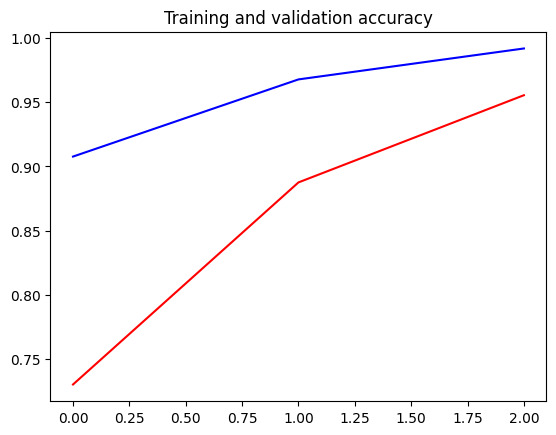

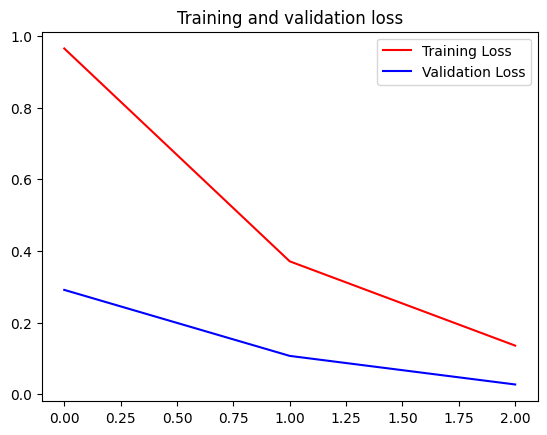

In [ ]:
import matplotlib.pyplot as plt

# Plot the model results
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')

plt.figure()

plt.plot(epochs, loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
test_datagen = ImageDataGenerator(rescale=1/255.)

In [ ]:
test_generator = test_datagen.flow_from_directory(
    directory = test_dir,
    batch_size = 32,
    class_mode = 'categorical',
    target_size = (150,150),
    # color_mode = 'rgb',
)

Found 406 images belonging to 16 classes.


In [ ]:
best_result = 0
for filee in os.listdir('/content/saved_model'):
  print(filee)
  best_model = tf.keras.models.load_model(os.path.join('/content/saved_model/', filee))
  result = best_model.evaluate(test_generator)
  if result[1] > best_result:
    best_result = result[1]
    print("best model is ", filee)

01-0.6321.h5
13/13 [==============================] - 8s 337ms/step - loss: 1.0301 - accuracy: 0.6995
best model is  01-0.6321.h5
02-0.7679.h5
13/13 [==============================] - 6s 334ms/step - loss: 0.5526 - accuracy: 0.8325
best model is  02-0.7679.h5
03-0.6897.h5
13/13 [==============================] - 5s 307ms/step - loss: 1.3870 - accuracy: 0.6897
16-0.7241.h5
13/13 [==============================] - 5s 298ms/step - loss: 2.7803 - accuracy: 0.7241
01-0.7675.h5
13/13 [==============================] - 6s 363ms/step - loss: 1.1168 - accuracy: 0.6847
13-0.7266.h5
13/13 [==============================] - 5s 303ms/step - loss: 2.4663 - accuracy: 0.7266
02-0.7143.h5
13/13 [==============================] - 5s 289ms/step - loss: 0.4822 - accuracy: 0.8645
best model is  02-0.7143.h5
10-0.6995.h5
13/13 [==============================] - 5s 294ms/step - loss: 2.5985 - accuracy: 0.6995
04-0.7537.h5
13/13 [==============================] - 8s 478ms/step - loss: 1.4142 - accuracy: 0.753

In [ ]:
best_model_path = '/content/saved_model/08-0.7679.h5'
best_model = tf.keras.models.load_model(best_model_path)
best_model.evaluate(train_generator)

592/592 [==============================] - 85s 134ms/step - loss: 0.3430 - accuracy: 0.9670


[0.34303343296051025, 0.9670469164848328]

In [ ]:
best_model.evaluate(val_generator)
best_model.evaluate(test_generator)

13/13 [==============================] - 6s 432ms/step - loss: 0.8661 - accuracy: 0.9062


[0.8661056160926819, 0.9061728119850159]

In [ ]:
test_score = model.evaluate(test_generator)
print("[INFO] accuracy: {:.2f}%".format(test_score[1] * 100))
print("[INFO] Loss: ",test_score[0])

13/13 [==============================] - 5s 374ms/step - loss: 0.9182 - accuracy: 0.7882
[INFO] accuracy: 78.82%
[INFO] Loss:  0.9182133674621582


In [ ]:
train_generator.class_indices.keys()
# val_generator.classes
# print(class_order)

dict_keys(['anggur', 'apple', 'ayam_krispi', 'bakso', 'bakwan', 'burger', 'cheesecake', 'crepes', 'donut', 'ice_cream', 'ikan', 'kebab', 'kentang_goreng', 'nasi_goreng', 'nasi_kuning', 'pizza'])

In [ ]:
# Assuming you already have the 'class_order' dictionary
class_order = train_generator.class_indices
order_class = {}
# Print the class order with class indices
for class_name, index in class_order.items():
    order_class[index] = class_name
    # print(f"Index: {index}, Class: {class_name}")
order_class


{0: 'anggur',
 1: 'apple',
 2: 'ayam_krispi',
 3: 'bakso',
 4: 'bakwan',
 5: 'burger',
 6: 'cheesecake',
 7: 'crepes',
 8: 'donut',
 9: 'ice_cream',
 10: 'ikan',
 11: 'kebab',
 12: 'kentang_goreng',
 13: 'nasi_goreng',
 14: 'nasi_kuning',
 15: 'pizza'}

In [ ]:
def predict_image(image_upload,folderName, model = best_model):
  im = image_upload
  im_array = np.asarray(im)
  im_array = im_array*(1/225)
  im_input = tf.reshape(im_array, shape = [1, 150, 150, 3])

  predict_proba = model.predict(im_input, verbose=0)[0]
  # predict_class = np.argmax(model.predict(im_input)[0])
  predict_class = np.argsort(predict_proba)[::-1][:3]
  if folderName != order_class[predict_class[0]]:
    plt.show()
    print("\nImage prediction result 1: ", order_class[predict_class[0]], " ", predict_proba[predict_class[0]] * 100 ,"%")
    print("\nImage prediction result 2: ", order_class[predict_class[1]], " ", predict_proba[predict_class[1]] * 100 ,"%")
    print("\nImage prediction result 3: ", order_class[predict_class[2]], " ", predict_proba[predict_class[2]] * 100 ,"%")
  return order_class[predict_class[0]], folderName


In [ ]:
# !gdown --folder --remaining-ok https://drive.google.com/drive/folders/1dWkrQboYMDd3yKwPLVKLpbnfnyWlSRXz?usp=sharing -O  '/content/test_data/'

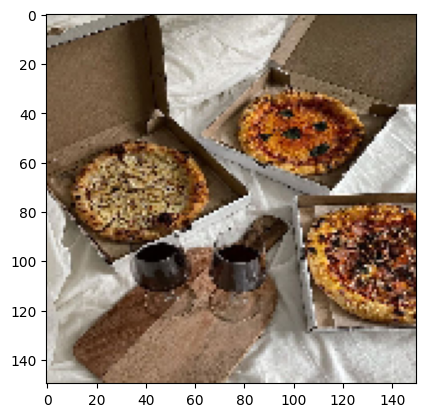


Image prediction result 1:  ayam_krispi   61.7522656917572 %

Image prediction result 2:  nasi_kuning   24.975216388702393 %

Image prediction result 3:  bakwan   8.186288923025131 %


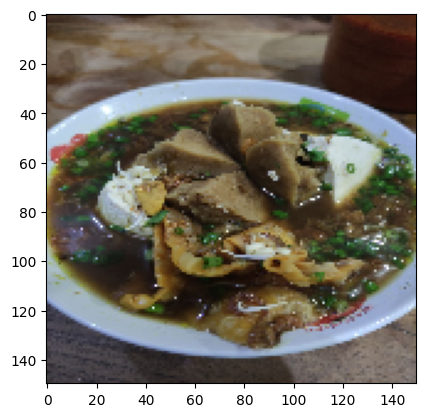


Image prediction result 1:  ice_cream   99.99668598175049 %

Image prediction result 2:  pizza   0.001754545337462332 %

Image prediction result 3:  kebab   0.0007646305675734766 %


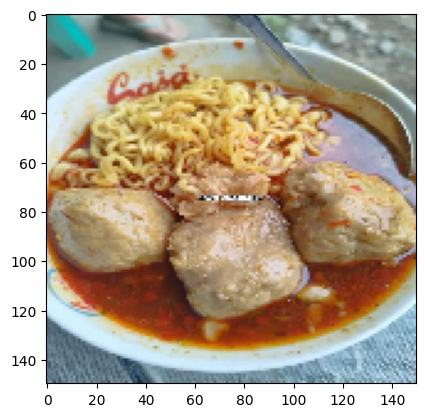


Image prediction result 1:  ayam_krispi   76.12243890762329 %

Image prediction result 2:  bakso   20.74228674173355 %

Image prediction result 3:  donut   1.9661959260702133 %


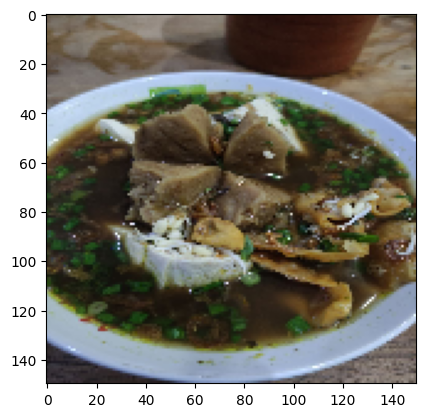


Image prediction result 1:  ice_cream   96.33637070655823 %

Image prediction result 2:  pizza   2.6138361543416977 %

Image prediction result 3:  kebab   0.6779409013688564 %


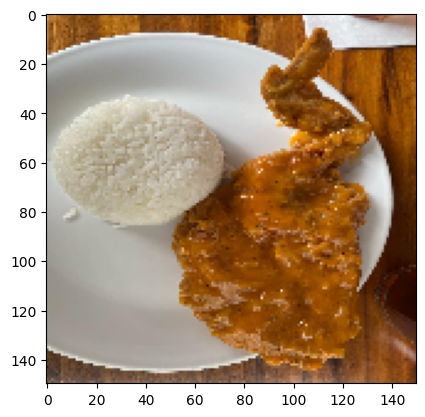


Image prediction result 1:  ice_cream   99.63665008544922 %

Image prediction result 2:  nasi_goreng   0.2965702209621668 %

Image prediction result 3:  ayam_krispi   0.052272522589191794 %


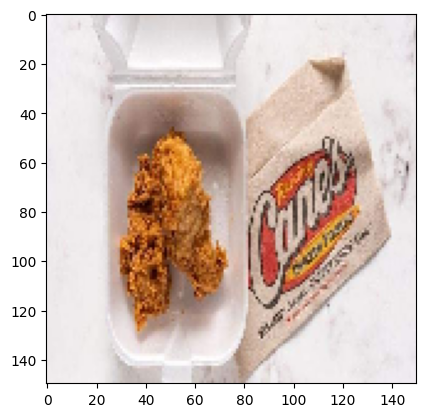


Image prediction result 1:  nasi_kuning   91.1081612110138 %

Image prediction result 2:  ikan   4.05062809586525 %

Image prediction result 3:  kentang_goreng   3.264579176902771 %


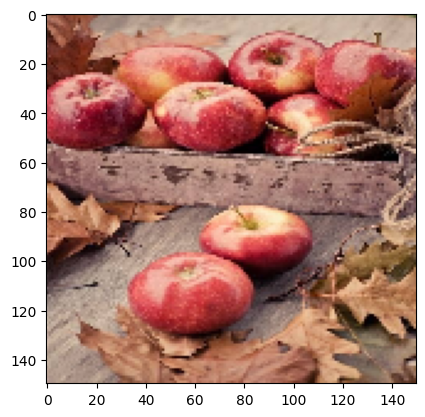


Image prediction result 1:  donut   95.20867466926575 %

Image prediction result 2:  ice_cream   4.380064830183983 %

Image prediction result 3:  apple   0.3790284739807248 %


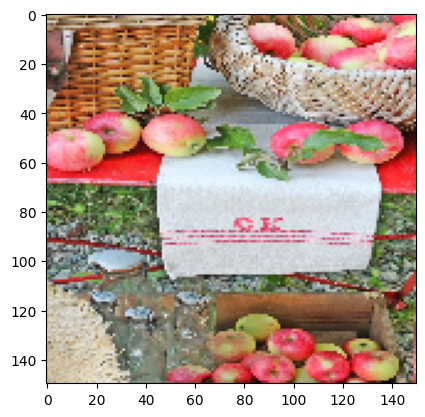


Image prediction result 1:  burger   61.711186170578 %

Image prediction result 2:  apple   17.766311764717102 %

Image prediction result 3:  cheesecake   16.440996527671814 %


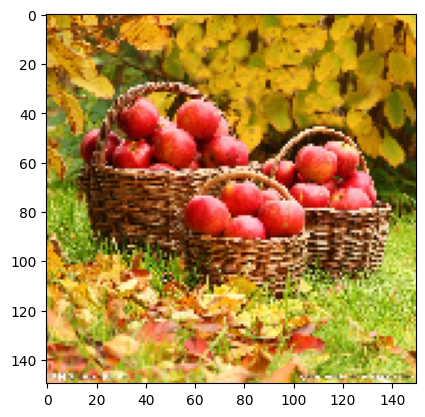


Image prediction result 1:  anggur   89.08968567848206 %

Image prediction result 2:  apple   10.910271108150482 %

Image prediction result 3:  donut   3.456122783518367e-05 %


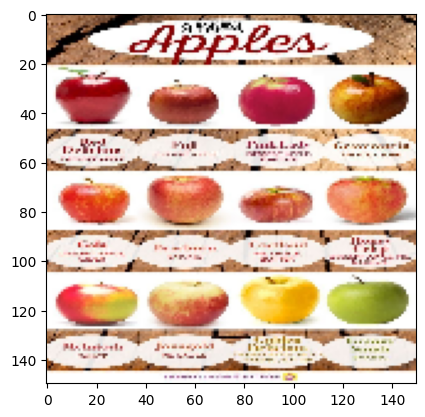


Image prediction result 1:  donut   99.69905614852905 %

Image prediction result 2:  cheesecake   0.15386051964014769 %

Image prediction result 3:  ice_cream   0.13717017136514187 %


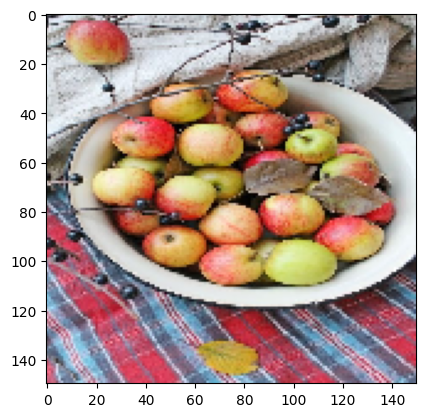


Image prediction result 1:  anggur   99.88706707954407 %

Image prediction result 2:  apple   0.11292659910395741 %

Image prediction result 3:  bakso   9.908132092562028e-08 %


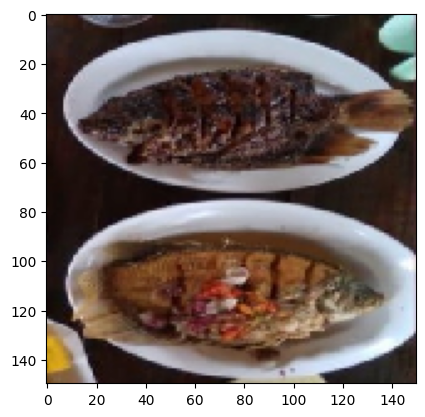


Image prediction result 1:  bakso   84.6047580242157 %

Image prediction result 2:  ikan   15.387038886547089 %

Image prediction result 3:  nasi_goreng   0.0042626692447811365 %


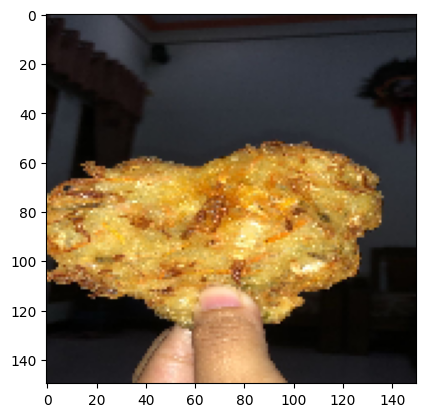


Image prediction result 1:  nasi_goreng   94.05779838562012 %

Image prediction result 2:  pizza   4.9059852957725525 %

Image prediction result 3:  nasi_kuning   0.887599028646946 %


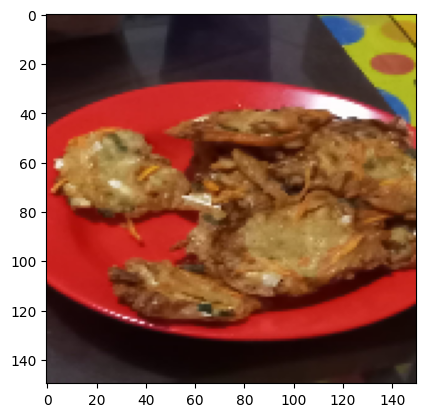


Image prediction result 1:  ikan   96.13906145095825 %

Image prediction result 2:  bakso   3.6780431866645813 %

Image prediction result 3:  bakwan   0.16727849142625928 %


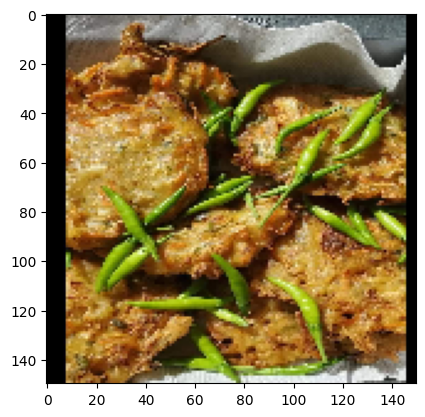


Image prediction result 1:  ayam_krispi   99.95428323745728 %

Image prediction result 2:  bakwan   0.032874036696739495 %

Image prediction result 3:  kentang_goreng   0.012824838631786406 %


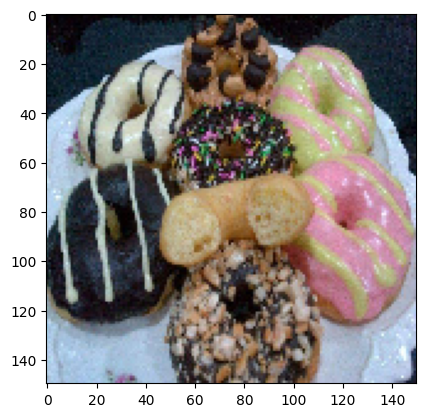


Image prediction result 1:  bakso   99.55577254295349 %

Image prediction result 2:  donut   0.3690743586048484 %

Image prediction result 3:  nasi_kuning   0.03643411328084767 %


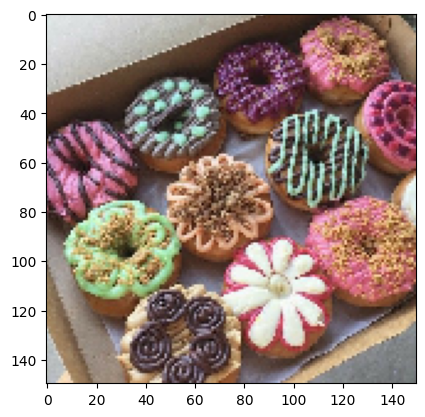


Image prediction result 1:  nasi_goreng   77.37593054771423 %

Image prediction result 2:  donut   15.110115706920624 %

Image prediction result 3:  anggur   5.565300211310387 %


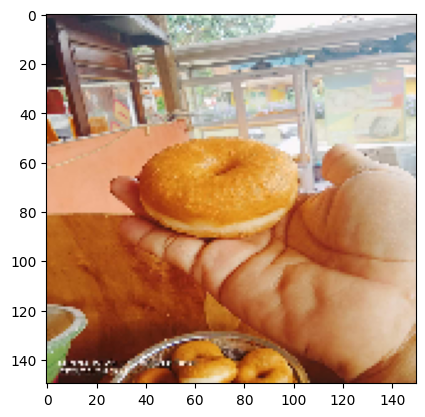


Image prediction result 1:  ice_cream   100.0 %

Image prediction result 2:  donut   3.642188106667277e-07 %

Image prediction result 3:  kentang_goreng   1.9380814730851625e-07 %


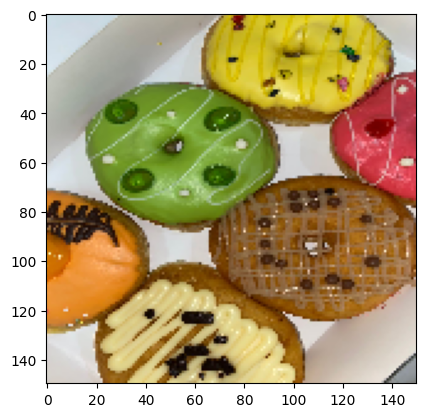


Image prediction result 1:  ice_cream   78.13124656677246 %

Image prediction result 2:  nasi_kuning   11.048885434865952 %

Image prediction result 3:  pizza   4.081898182630539 %


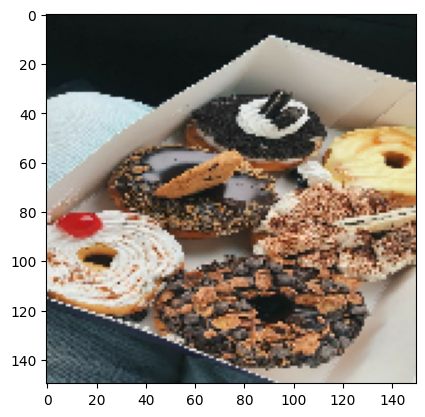


Image prediction result 1:  ayam_krispi   96.36131525039673 %

Image prediction result 2:  pizza   3.0702192336320877 %

Image prediction result 3:  nasi_kuning   0.45820907689630985 %


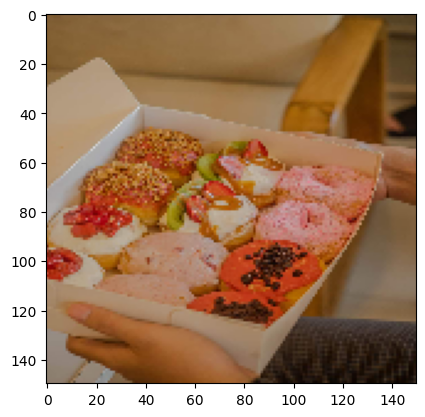


Image prediction result 1:  kentang_goreng   53.85251045227051 %

Image prediction result 2:  pizza   18.35474967956543 %

Image prediction result 3:  ice_cream   15.784953534603119 %


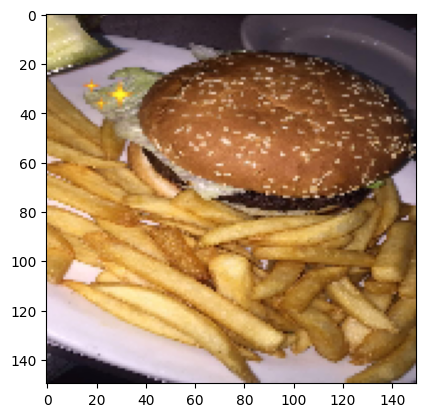


Image prediction result 1:  burger   100.0 %

Image prediction result 2:  kentang_goreng   5.125745938805437e-08 %

Image prediction result 3:  donut   3.360989871831199e-11 %


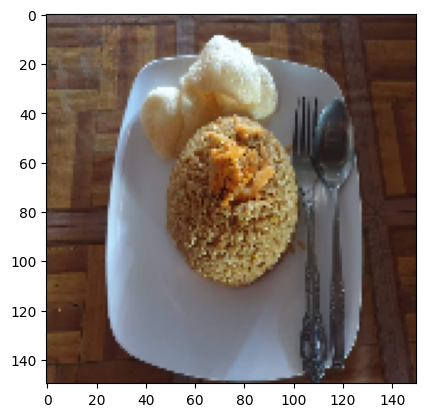


Image prediction result 1:  ice_cream   99.99312162399292 %

Image prediction result 2:  donut   0.0066600558056961745 %

Image prediction result 3:  nasi_kuning   0.00011411177638365189 %


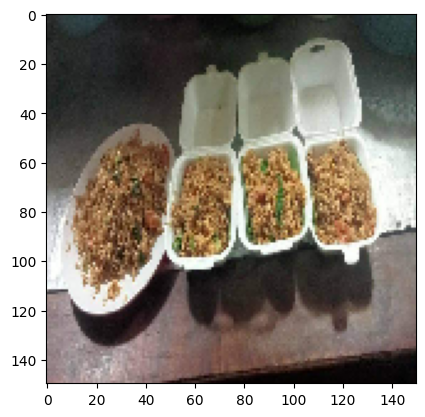


Image prediction result 1:  ayam_krispi   99.5613694190979 %

Image prediction result 2:  donut   0.3671560203656554 %

Image prediction result 3:  anggur   0.07058504270389676 %


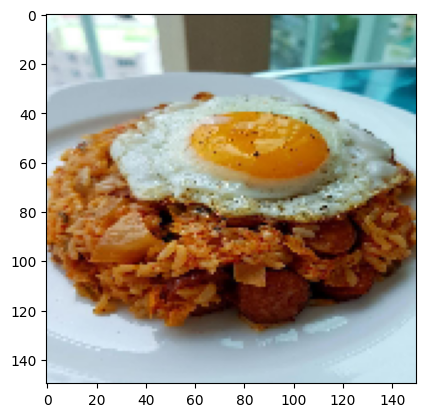


Image prediction result 1:  ayam_krispi   99.56474900245667 %

Image prediction result 2:  nasi_goreng   0.4346918314695358 %

Image prediction result 3:  nasi_kuning   0.00026176633127761306 %


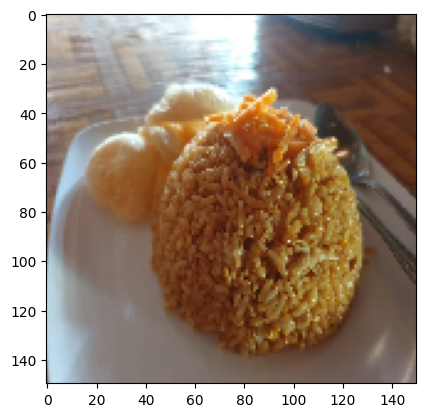


Image prediction result 1:  ice_cream   99.33043122291565 %

Image prediction result 2:  nasi_kuning   0.35943067632615566 %

Image prediction result 3:  nasi_goreng   0.305809173732996 %


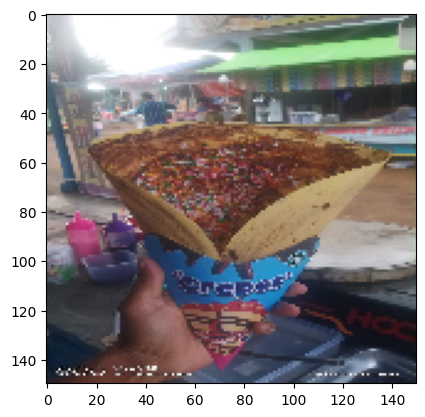


Image prediction result 1:  ice_cream   99.98835325241089 %

Image prediction result 2:  cheesecake   0.01162032931460999 %

Image prediction result 3:  pizza   1.9082290236838162e-05 %


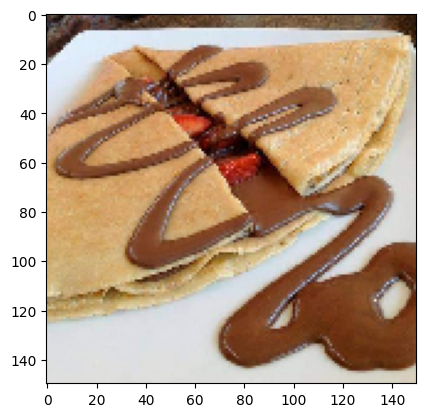


Image prediction result 1:  cheesecake   99.99995231628418 %

Image prediction result 2:  ice_cream   5.239704137238732e-05 %

Image prediction result 3:  pizza   1.1716607718759153e-09 %


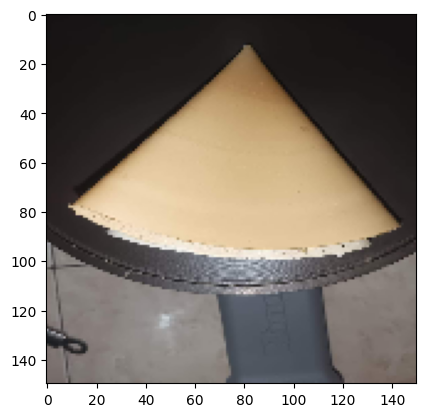


Image prediction result 1:  cheesecake   94.98077630996704 %

Image prediction result 2:  crepes   5.016819015145302 %

Image prediction result 3:  kentang_goreng   0.0014441577150137164 %


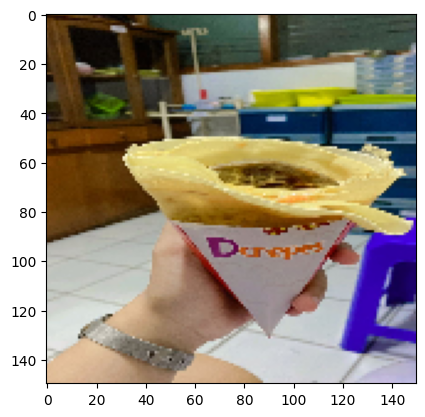


Image prediction result 1:  ice_cream   99.99996423721313 %

Image prediction result 2:  kebab   3.0547454343832214e-05 %

Image prediction result 3:  crepes   1.0885389478687557e-06 %


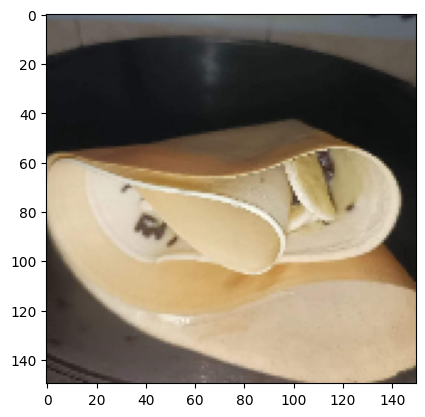


Image prediction result 1:  cheesecake   98.81200790405273 %

Image prediction result 2:  ice_cream   0.9794720448553562 %

Image prediction result 3:  donut   0.20845832768827677 %


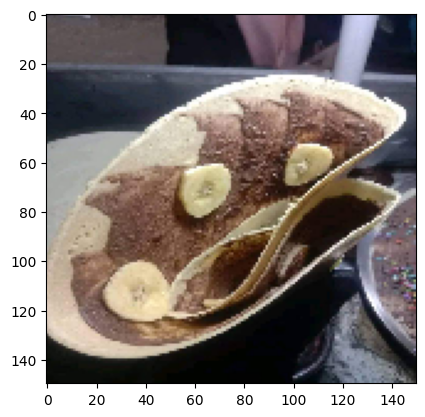


Image prediction result 1:  ice_cream   99.96743202209473 %

Image prediction result 2:  donut   0.029146732413209975 %

Image prediction result 3:  crepes   0.0034083343052770942 %


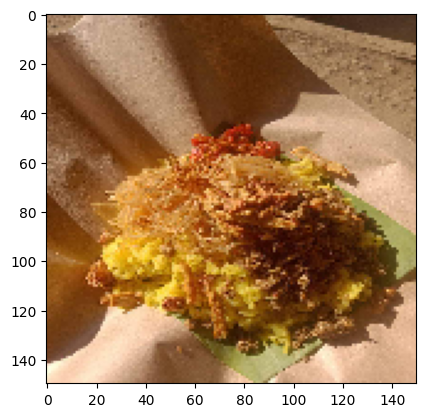


Image prediction result 1:  nasi_goreng   99.72932934761047 %

Image prediction result 2:  nasi_kuning   0.228907261043787 %

Image prediction result 3:  pizza   0.03459537692833692 %


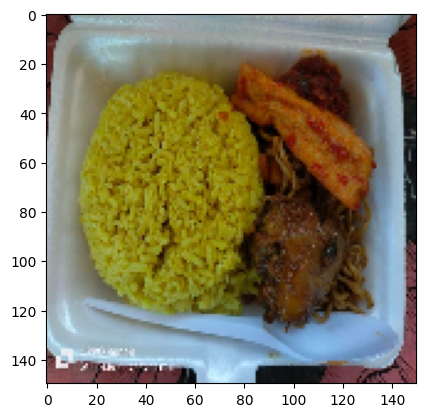


Image prediction result 1:  ayam_krispi   73.06526899337769 %

Image prediction result 2:  nasi_goreng   25.362029671669006 %

Image prediction result 3:  nasi_kuning   1.5703707933425903 %


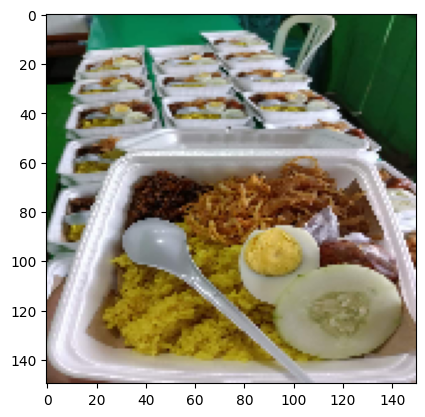


Image prediction result 1:  ice_cream   99.93910789489746 %

Image prediction result 2:  donut   0.0591454969253391 %

Image prediction result 3:  ayam_krispi   0.0015117267139430624 %


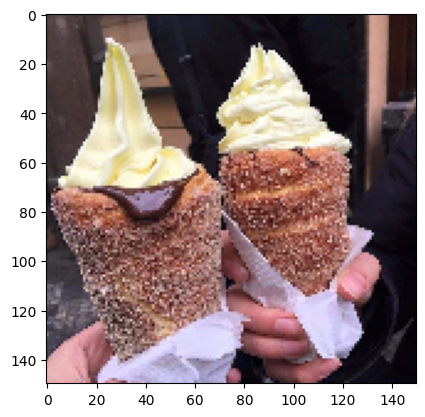


Image prediction result 1:  crepes   97.1780002117157 %

Image prediction result 2:  ice_cream   2.387278340756893 %

Image prediction result 3:  cheesecake   0.3197690472006798 %


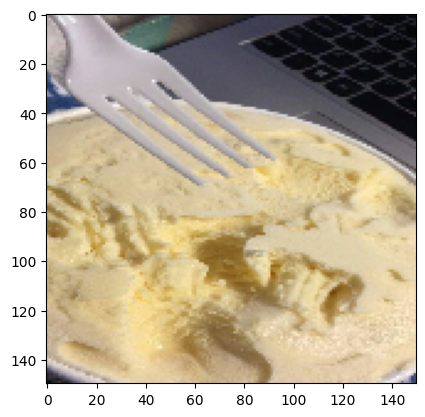


Image prediction result 1:  kentang_goreng   76.27682089805603 %

Image prediction result 2:  ayam_krispi   13.75599354505539 %

Image prediction result 3:  bakwan   7.4940405786037445 %


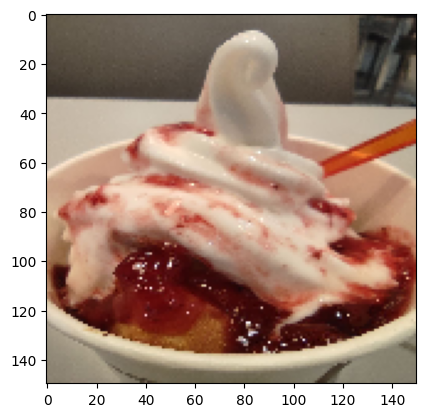


Image prediction result 1:  cheesecake   86.07040643692017 %

Image prediction result 2:  ice_cream   13.928627967834473 %

Image prediction result 3:  burger   0.0007215973710117396 %


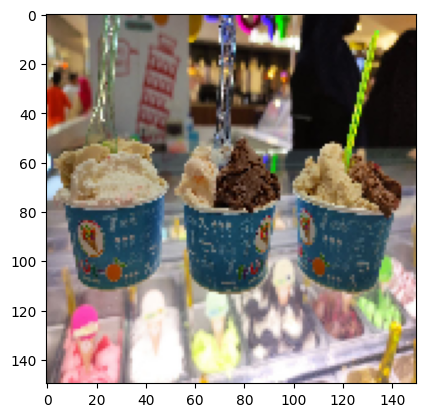

In [ ]:
import numpy as np
from tensorflow.keras.utils import load_img, img_to_array
import matplotlib.pyplot as plt
from PIL import Image
import io
from PIL import UnidentifiedImageError
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
true_labels = []  # List of true labels for each image
predicted_labels = []# List of predicted labels for each image
test_path = test_dir
for folder in os.listdir(test_path):
  for filename in os.listdir(os.path.join(test_path, folder)):
    try:
      img = load_img(os.path.join(test_path, os.path.join(folder, filename)), target_size=(150,150))
    except UnidentifiedImageError:
      continue
    except IsADirectoryError:
      continue
    imgplot = plt.imshow(img)
    x = img_to_array(img)
    x = np.expand_dims(x, axis=0)
    img = np.vstack([x])
    predicted_label, true_label = predict_image(img, folder)
    predicted_labels.append(predicted_label)
    true_labels.append(true_label)

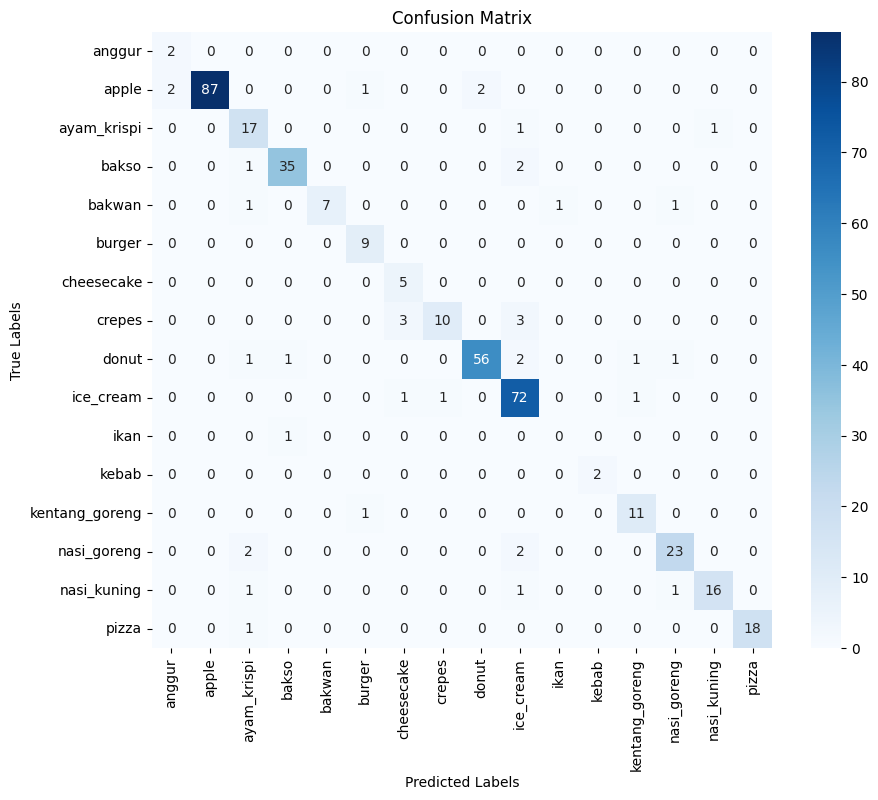

In [ ]:
# Create confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)

# Display the confusion matrix using seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=train_generator.class_indices, yticklabels=train_generator.class_indices)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
from sklearn.metrics import classification_report
class_report = classification_report(true_labels, predicted_labels, target_names=train_generator.class_indices)
print("Classification Report:\n", class_report)

Classification Report:
                 precision    recall  f1-score   support

        anggur       0.50      1.00      0.67         2
         apple       1.00      0.95      0.97        92
   ayam_krispi       0.71      0.89      0.79        19
         bakso       0.95      0.92      0.93        38
        bakwan       1.00      0.70      0.82        10
        burger       0.82      1.00      0.90         9
    cheesecake       0.56      1.00      0.71         5
        crepes       0.91      0.62      0.74        16
         donut       0.97      0.90      0.93        62
     ice_cream       0.87      0.96      0.91        75
          ikan       0.00      0.00      0.00         1
         kebab       1.00      1.00      1.00         2
kentang_goreng       0.85      0.92      0.88        12
   nasi_goreng       0.88      0.85      0.87        27
   nasi_kuning       0.94      0.84      0.89        19
         pizza       1.00      0.95      0.97        19

      accuracy        

In [ ]:
from google.colab import files
import numpy as np
from tensorflow.keras.utils import load_img, img_to_array
import matplotlib.pyplot as plt
uploaded = files.upload()

for fn in uploaded.keys():
  path = fn
  img = load_img(path, target_size=(150,150))
  imgplot = plt.imshow(img)
  x = img_to_array(img)
  x = np.expand_dims(x, axis=0)
  img = np.vstack([x])

predict_image(img)

In [ ]:
file_list = os.listdir('data_training')


# Find the minimum length of file names
min_length = min(len(os.listdir('data_training/' + file_name)) for file_name in file_list)
min_length

In [ ]:
root_dir = 'data_training'
extensions = []
for fldr in os.listdir(root_dir):
    sub_folder_path = os.path.join(root_dir, fldr)
    listdir = os.listdir(sub_folder_path)
    for filee in listdir[458:]:
        file_path = os.path.join(sub_folder_path, filee)
        print(len(listdir))
        # os.remove(file_path)